# Detectron2 Baseline for kaggle HuBMAP-HHV competition

<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">


## Install detectron2

In [ ]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 6.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.1-cp310-cp310-linux_x86_64.whl size=44091 sha256=f1760427791543c5d745f92edb4be1ebfb271a1998c6d0b0b2f5bdec7b6572c8
  Stored in directory: /root/.cache/pip/wheels/70/83/31/975b737609aba39a4099d471d5684141c1fdc3404f97e7f68a
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0.1
    Uninstalling PyYAML-6.0.1:
      Successfully uninstalled PyYAML-6.0.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2022.12.1 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.
flax 0.7.0 requires PyYAML>=5.4.1, but you have pyyaml 5.1 which is incompatible.
Cloning into 'detectron2'...
remote: Enumerating objects: 15180, done.
remote: Counting ob

In [ ]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0
torch:  2.0 ; cuda:  cu118
detectron2: 0.6


In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

## Fine-tuning on HuBMAP-HHV dataset

In this section, we will train an existing detectron2 model on the HuBMAP-HHV competition dataset. The model was pre-trained on a COCO dataset and it is a Mask R-CNN based on a ResNet-101 backbone. The HuBMAP-HHV dataset is first converted to COCO format (The
converted dataset can be seen [here](https://www.kaggle.com/datasets/ammarnassanalhajali/coco-dataset-hubmap-2023/versions/8)).

### Prepare the HuBMAP dataset

In [ ]:
%cd /content

/content


In [ ]:
!pip install kaggle
!mkdir -p ~/.kaggle

In [ ]:
# Insert your credentials here
%%writefile ~/.kaggle/kaggle.json
{"username":"USER","key":"TOKEN"}

Writing /root/.kaggle/kaggle.json


In [ ]:
!chmod 600 ~/.kaggle/kaggle.json
!ls -lha ~/.kaggle/kaggle.json

-rw------- 1 root root 63 Jul 31 09:19 /root/.kaggle/kaggle.json


In [ ]:
# Download the HuBMAP-HHV competition dataset
!kaggle competitions download -c hubmap-hacking-the-human-vasculature
!unzip -o hubmap-hacking-the-human-vasculature.zip > /dev/null

 88% 3.48G/3.97G [02:58<00:22, 23.0MB/s]

In [ ]:
# Download the converted COCO dataset
# Since it is not possible to load a specific version of a kaggle dataset
# via cli and the dataset has already been updated, we upload manually the
# COCO Dataset [HuBMAP 2023] dataset ver. 8 found in
# https://www.kaggle.com/datasets/ammarnassanalhajali/coco-dataset-hubmap-2023/versions/8
# In this dataset only 'blood_vessels' and 'glomerulus' classes are included
MANUAL_UPLOAD = True

In [ ]:
if not MANUAL_UPLOAD:
  coco_ann_train = "coco_annotations_train_class_1_folds5_fold1.json"
  coco_ann_valid = "coco_annotations_valid_class_1_folds5_fold1.json"
  !kaggle datasets download -d ammarnassanalhajali/coco-dataset-hubmap-2023
  !unzip -o coco-dataset-hubmap-2023.zip > /dev/null
else:
  coco_ann_train = "coco_annotations_train_all_fold1.json"
  coco_ann_valid = "coco_annotations_valid_all_fold1.json"
  # ver.8 of coco-dataset-hubmap-2023 must be manually uploaded in this Colab notebook
  !unzip -o "COCODataset[HuBMAP 2023]-V8.zip" > /dev/null

In [ ]:
from detectron2.data.datasets import register_coco_instances

# Registering the datasets
registered_train = "hubmap-train"
registered_valid = "hubmap-valid"
register_coco_instances(registered_train, {}, coco_ann_train, "train")
register_coco_instances(registered_valid, {}, coco_ann_valid, "train")

hubmap_metadata = MetadataCatalog.get(registered_train)

In [ ]:
hubmap_metadata

namespace(name='hubmap-train',
          json_file='coco_annotations_train_all_fold1.json',
          image_root='train',
          evaluator_type='coco')

### Visualization of annotations
To verify the dataset is in correct format, let's visualize the annotations of some selected samples in the training set:



loading annotations into memory...
Done (t=0.62s)
creating index...
index created!


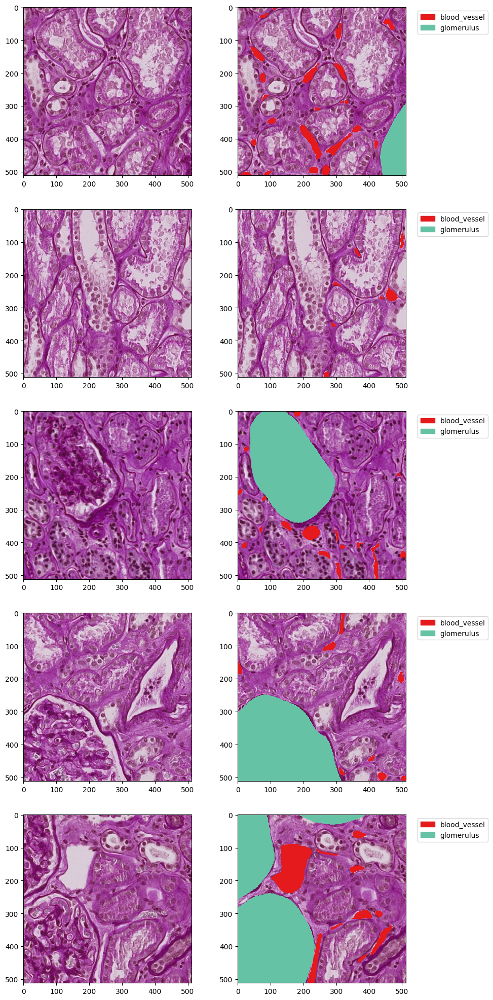

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from pycocotools.coco import COCO
import cv2

INPUT_PATH = '.'
dataDir = os.path.join(INPUT_PATH, 'train')
annFile = os.path.join(INPUT_PATH, coco_ann_train)

colors = ['Set1', 'Set2']
legend = {1: 'blood_vessel', 2: 'glomerulus'}

coco = COCO(annFile)
imgIds = coco.getImgIds()
imgs = coco.loadImgs(imgIds[10:15])

fig, axs = plt.subplots(len(imgs), 2, figsize=(10, 5*len(imgs)))
for img, ax_row in zip(imgs, axs):
    ax = ax_row[0]  # Access the first axis in each row
    I = cv2.imread(os.path.join(dataDir, img["file_name"]))
    annIds = coco.getAnnIds(imgIds=[img["id"]])
    anns = coco.loadAnns(annIds)
    ax.imshow(I)
    ax = ax_row[1]  # Access the second axis in each row
    ax.imshow(I)
    plt.sca(ax)
    for i, ann in enumerate(anns):
        category_id = ann['category_id']
        color = colors[category_id-1]
        mask = coco.annToMask(ann)
        mask = np.ma.masked_where(mask == 0, mask)
        ax.imshow(mask, cmap=color, alpha=1)
        handles = []
        for category_id in legend:
            color = colors[category_id - 1]
            handles.append(mpatches.Patch(color=plt.colormaps.get_cmap(color)(0)))
        ax.legend(handles, legend.values(), bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

### Training the model

Now, let's fine-tune a COCO-pretrained R101-FPN Mask R-CNN model on the HuBMAP-HHV dataset. The model is quite large, so it converges rather quickly at 5000 iterations, which takes about ~25 minutes on a T4 GPU.


In [ ]:
from detectron2.engine import DefaultTrainer

# Configuraion of the model
pretrained_cfg = "COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"
# pretrained_cfg = "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(pretrained_cfg))
cfg.DATASETS.TRAIN = (registered_train,)
cfg.DATASETS.TEST = (registered_valid,)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(pretrained_cfg)  # Let training initialize from model zoo
cfg.INPUT.MASK_FORMAT='bitmask'
cfg.SOLVER.WARMUP_ITERS = 100
cfg.SOLVER.IMS_PER_BATCH = 1
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 5000    # 500 iterations seems good enough for this dataset
cfg.SOLVER.STEPS = []         # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   # The "RoIHead batch size".
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2  # 2 types of masks.
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.2 # a rather low threshold is suitable


In [15]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[07/31 09:26:43 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_a3ec72.pkl: 254MB [00:01, 178MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[07/31 09:26:45 d2.engine.train_loop]: Starting training from iteration 0


/content/detectron2/detectron2/data/detection_utils.py:446: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  torch.stack([torch.from_numpy(np.ascontiguousarray(x)) for x in masks])
/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/content/detectron2/detectron2/data/detection_utils.py:446: UserWarning: The given NumPy array is not writable, and PyTorch does not suppor

[07/31 09:27:02 d2.utils.events]:  eta: 0:22:18  iter: 19  total_loss: 3.277  loss_cls: 0.9597  loss_box_reg: 0.1447  loss_mask: 0.6901  loss_rpn_cls: 1.543  loss_rpn_loc: 0.09722    time: 0.2833  last_time: 0.2398  data_time: 0.0326  last_data_time: 0.0036   lr: 4.7703e-05  max_mem: 1945M
[07/31 09:27:17 d2.utils.events]:  eta: 0:21:15  iter: 39  total_loss: 1.75  loss_cls: 0.4214  loss_box_reg: 0.2012  loss_mask: 0.6618  loss_rpn_cls: 0.406  loss_rpn_loc: 0.0808    time: 0.3442  last_time: 0.2720  data_time: 0.0053  last_data_time: 0.0042   lr: 9.7652e-05  max_mem: 2060M
[07/31 09:27:22 d2.utils.events]:  eta: 0:20:47  iter: 59  total_loss: 1.483  loss_cls: 0.2898  loss_box_reg: 0.1867  loss_mask: 0.6117  loss_rpn_cls: 0.2933  loss_rpn_loc: 0.08537    time: 0.3090  last_time: 0.2609  data_time: 0.0041  last_data_time: 0.0039   lr: 0.0001476  max_mem: 2060M
[07/31 09:27:27 d2.utils.events]:  eta: 0:20:50  iter: 79  total_loss: 1.273  loss_cls: 0.2816  loss_box_reg: 0.2036  loss_mask: 

In [ ]:
# Don't execute above if loading a model from filesystem
# cfg.MODEL.WEIGHTS = os.path.join("/content/output", "model_final.pth")
# # cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.3
# trainer = DefaultTrainer(cfg)
# trainer.resume_or_load(resume=False)

### Evaluating the model

In [16]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator(registered_valid, cfg, False, output_dir="./output/")
cfg.MODEL.WEIGHTS="/content/output/model_0004999.pth"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.2  # set a custom testing threshold
val_loader = build_detection_test_loader(cfg, registered_valid)
inference_on_dataset(trainer.model, val_loader, evaluator)


[07/31 09:52:44 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [07/31 09:52:44 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[07/31 09:52:44 d2.data.datasets.coco]: Loaded 327 images in COCO format from coco_annotations_valid_all_fold1.json
[07/31 09:52:44 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[07/31 09:52:44 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[07/31 09:52:44 d2.data.common]: Serializing 327 elements to byte tensors and concatenating them all ...
[07/31 09:52:44 d2.data.common]: Serialized dataset takes 0.55 MiB
[07/31 09:52:44 d2.evaluation.evaluator]: Start inference on 327 batches
[07/31 09:52:46 d2.evaluation.evaluator]: Inference done 11

OrderedDict([('bbox',
              {'AP': 44.03210995885721,
               'AP50': 64.8817208453008,
               'AP75': 44.86862236506015,
               'APs': 13.670206928557468,
               'APm': 33.790432891964116,
               'APl': 54.870781233623156,
               'AP-blood_vessel': 27.612548917506132,
               'AP-glomerulus': 60.451671000208286}),
             ('segm',
              {'AP': 45.46061431741565,
               'AP50': 66.2807403440132,
               'AP75': 43.99077023887599,
               'APs': 12.691631620524044,
               'APm': 34.143522577329094,
               'APl': 60.6313826934783,
               'AP-blood_vessel': 26.913882315355448,
               'AP-glomerulus': 64.00734631947586})])

In [17]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

## Save model and logs to kaggle

A new "dataset" is created in kaggle with the log files and the produced model for later use from the competition inference notebook.

In [18]:
# A workaround for some Colab error appearing now and then
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [19]:
!kaggle datasets init -p /content/output # You must manual edit the title and the id in file "output/dataset-metadata.json"!

Data package template written to: /content/output/dataset-metadata.json


In [ ]:
!kaggle datasets create -p /content/output

Starting upload for file metrics.json
100% 308k/308k [00:01<00:00, 177kB/s]  
Upload successful: metrics.json (308KB)
Starting upload for file coco_instances_results.json
100% 1.67M/1.67M [00:01<00:00, 903kB/s]
Upload successful: coco_instances_results.json (2MB)
Starting upload for file instances_predictions.pth
100% 1.12M/1.12M [00:01<00:00, 843kB/s]
Upload successful: instances_predictions.pth (1MB)
Starting upload for file events.out.tfevents.1690717908.3bb85c058f5c.651.0
100% 452k/452k [00:01<00:00, 266kB/s]
Upload successful: events.out.tfevents.1690717908.3bb85c058f5c.651.0 (452KB)
Starting upload for file last_checkpoint
100% 17.0/17.0 [00:01<00:00, 12.8B/s]
Upload successful: last_checkpoint (17B)
Starting upload for file model_0004999.pth
100% 480M/480M [00:07<00:00, 71.6MB/s]
Upload successful: model_0004999.pth (480MB)
Your private Dataset is being created. Please check progress at https://www.kaggle.com/datasets/theo88/hubmap-hhv-model-rn-101-cocov8
